## Notebook Purpose
This notebook is used to plot high-resolution zoomed-in SMB maps over sections of Imja Lhotse Shar Glacier (Figure 6 A/B).

#### Last updated: May 23, 2023

## TODO:
- Update imports when new library has been built up with all updates
-Generalise path to data products during revisions, after the data distribution plan is finalized

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'


In [2]:
import numpy as np 
import geopandas as gpd
import matplotlib.pyplot as plt
from imview import pltlib
import pandas as pd
from pygeotools.lib import warplib,geolib,iolib,malib,filtlib,timelib
import os,sys,glob,shutil
from velocity_proc import glac_dyn, constants, velocity_filter,velocity_timeseries
import warnings
warnings.filterwarnings('ignore')

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
%matplotlib inline

In [4]:
%cd /nobackup/sbhusha1/chapter2/imja/20230223/

/nobackupp11/sbhusha1/chapter2/imja/20230223


In [5]:
vx_fn = '20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vx_skiprate_1_gauss_fill51px_shpclip.tif'
vy_fn = '20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vy_skiprate_1_gauss_fill51px_shpclip.tif'
euldz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif'
lagdz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_lagrangian_dhdt.tif'
downslope_dz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_downslope_dhdt.tif'
smb_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_smb_dhdt.tif'
dem1_fn = '../20151002_0651_10200100457F0C00_1020010042C0CE00-DEM_2m.tif'
ortho_img1 = '20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip.tif'
ortho_img2 = '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip.tif'

In [6]:
ds_list = warplib.memwarp_multi_fn([ortho_img1,ortho_img2,vx_fn,vy_fn])


Warping all inputs to the following:
Resolution: 0.51
Extent: [494238.98186541745, 3085990.8732606973, 495029.48186541745, 3086813.963260697]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 4: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip.tif
nl: 1614 ns: 1550 res: 0.510
0...10...20...30...40...50...60...70...80...90...2 of 4: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip.tif
nl: 1614 ns: 1550 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...3 of 4: 20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vx_skiprate_1_gauss_fill51px_shpclip.tif
nl: 1614 ns: 1550 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...4 of 4: 20151002_combined_hs_masked__20161029_combi

In [7]:
dt = timelib.get_t_factor(timelib.fn_getdatetime(ortho_img1),timelib.fn_getdatetime(ortho_img2))
ortho1,ortho2,vx,vy = [iolib.ds_getma(ds) for ds in ds_list]
_,ortho2_shifted = glac_dyn.compute_lagrangian(ortho1.astype(np.float32),ortho2.astype(np.float32),vx,vy,dt,
                                               annual=True,res=geolib.get_res(ds_list[0])[0],startofpath=True,return_shifted_dem=True)

In [8]:
ortho1,ortho2,vx,vy = [iolib.ds_getma(ds) for ds in ds_list]

In [9]:
_,ortho2_shifted = glac_dyn.compute_lagrangian(ortho1.astype(np.float32),ortho2.astype(np.float32),vx,vy,dt,
                                               annual=True,res=geolib.get_res(ds_list[0])[0],startofpath=True,return_shifted_dem=True)

<Axes: >

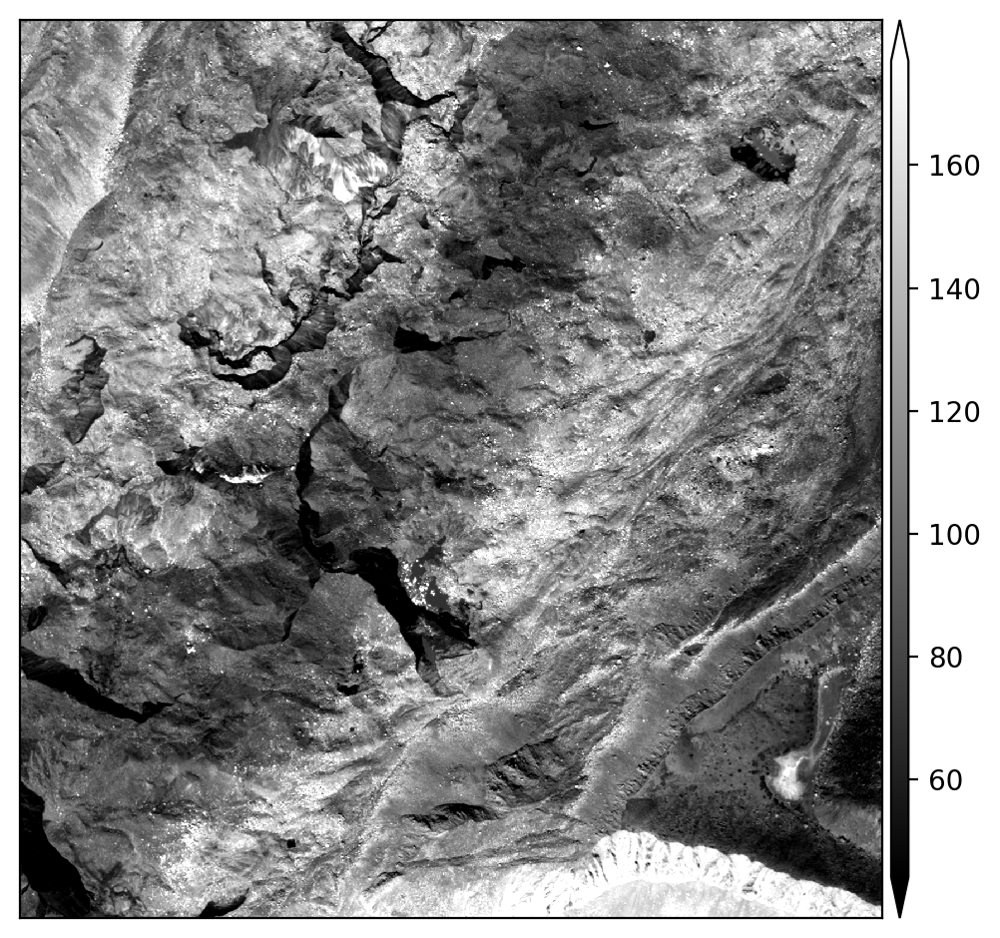

In [10]:
f,ax = plt.subplots()
pltlib.iv(ortho1,ax=ax,cmap='gray')

<Axes: >

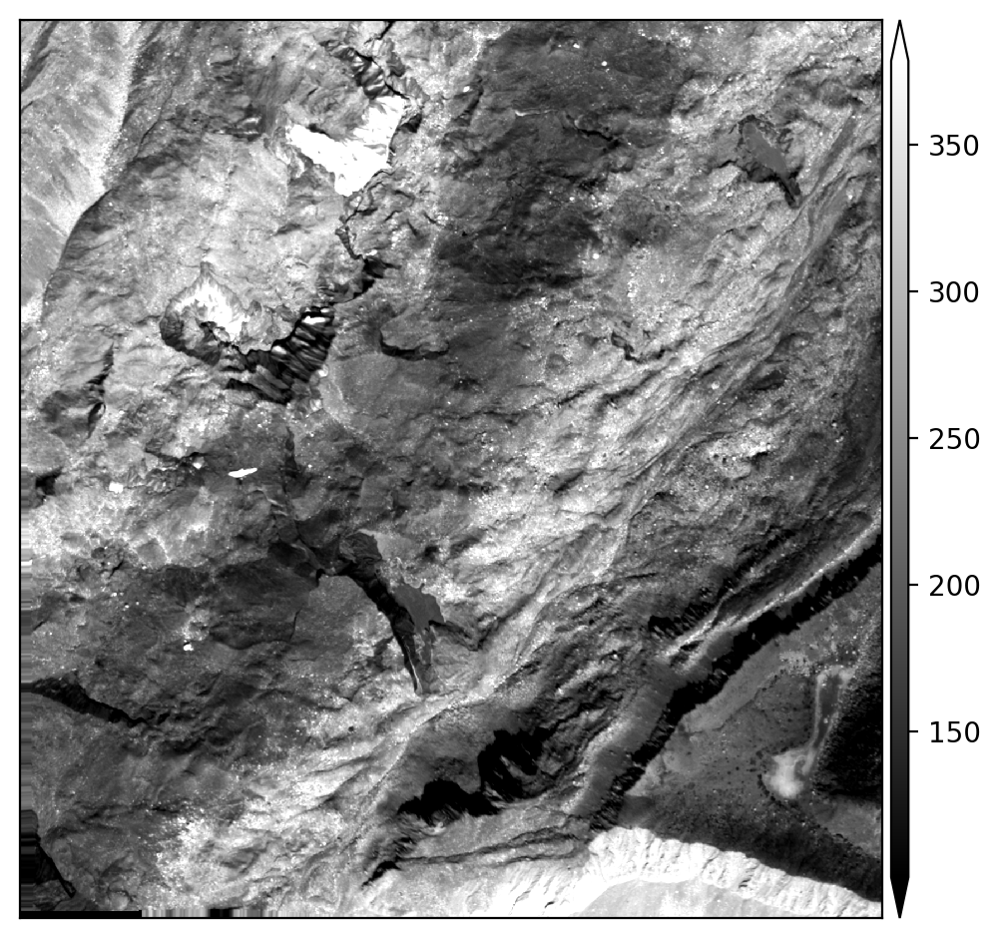

In [11]:
f,ax = plt.subplots()
pltlib.iv(ortho2_shifted,ax=ax,cmap='gray')

<Axes: >

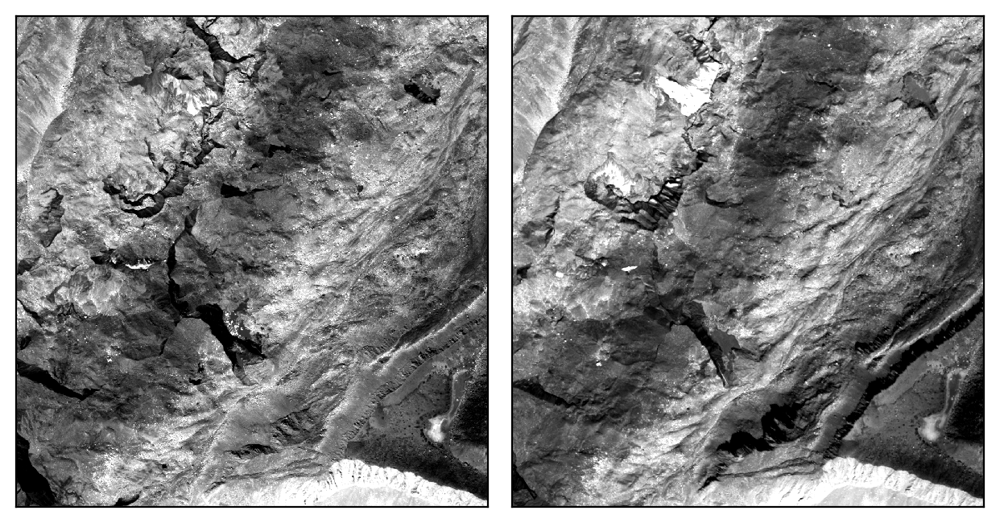

In [12]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
pltlib.iv(ortho1,ax=ax[0],cmap='gray',cbar=False)
pltlib.iv(ortho2,ax=ax[1],cmap='gray',cbar=False)

<Axes: >

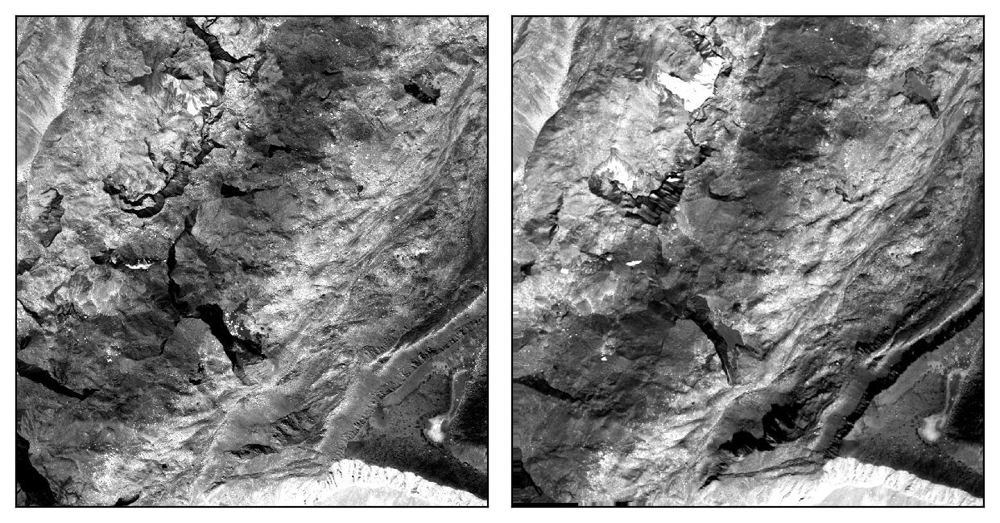

In [13]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
pltlib.iv(ortho1,ax=ax[0],cmap='gray',cbar=False)
pltlib.iv(ortho2_shifted,ax=ax[1],cmap='gray',cbar=False)

In [14]:
ax[1].get_ylim()

(1613.5, -0.5)

In [15]:
xlim = (201.09356776208483, 982.7736939731424)
ylim = (1169.193387243667, 317.362480475207)

In [16]:
mask_array = np.ma.getdata(np.ones_like(ortho1))

In [17]:
mask_array

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint16)

In [18]:
mask_array.sum()

2501700

In [19]:
mask_array.shape

(1614, 1550)

In [22]:
mask_array = np.ma.getdata(np.ones_like(ortho1))
mask_array[int(ylim[1]):int(ylim[0]),int(xlim[0]):int(xlim[1])] = 0

In [21]:
mask_array.sum()

2501700

<Axes: >

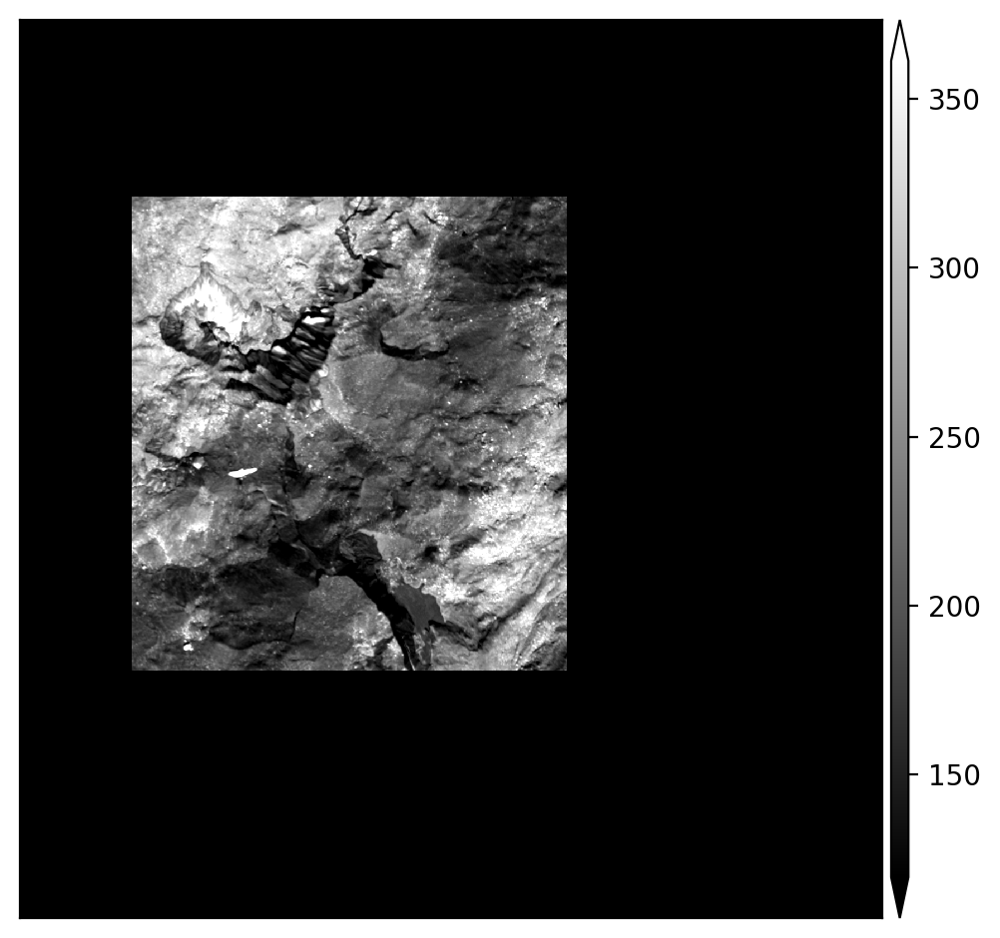

In [23]:
f,ax = plt.subplots()
pltlib.iv(np.ma.array(ortho2_shifted,mask=mask_array),ax=ax,cmap='gray')

In [24]:
clip_ortho1 = os.path.splitext(ortho_img1)[0]+'_cliff_area1.tif'
clip_ortho2 = os.path.splitext(ortho_img2)[0]+'_shifted_cliff_area1.tif'
iolib.writeGTiff(np.ma.array(ortho1,mask=mask_array),clip_ortho1,src_ds=ds_list[0])
iolib.writeGTiff(np.ma.array(ortho2_shifted,mask=mask_array),clip_ortho2,src_ds=ds_list[1])

In [25]:
! ndvtrim.py $clip_ortho1

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
Loading input raster into masked array
Computing min/max indices for mask
[0, 1614, 0, 1550]
[317, 1168, 201, 981]
Updating output geotransform
(494238.98186541745, 0.51, 0.0, 3086813.963260697, 0.0, -0.51)
(494341.49186541745, 0.51, 0.0, 3086652.2932606973, 0.0, -0.51)
Writing out: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip_cliff_area1_trim.tif


In [26]:
! ndvtrim.py $clip_ortho2

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
Loading input raster into masked array
Computing min/max indices for mask
[0, 1614, 0, 1550]
[317, 1168, 201, 981]
Updating output geotransform
(494238.98186541745, 0.51, 0.0, 3086813.963260697, 0.0, -0.51)
(494341.49186541745, 0.51, 0.0, 3086652.2932606973, 0.0, -0.51)
Writing out: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip_shifted_cliff_area1_trim.tif


In [27]:
ds_list_ortho_cliff1 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip_cliff_area1_trim.tif',
                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip_shifted_cliff_area1_trim.tif'])
cliff1_t1,cliff1_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff1]


Warping all inputs to the following:
Resolution: 0.51
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip_cliff_area1_trim.tif
2 of 2: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip_shifted_cliff_area1_trim.tif


<Axes: >

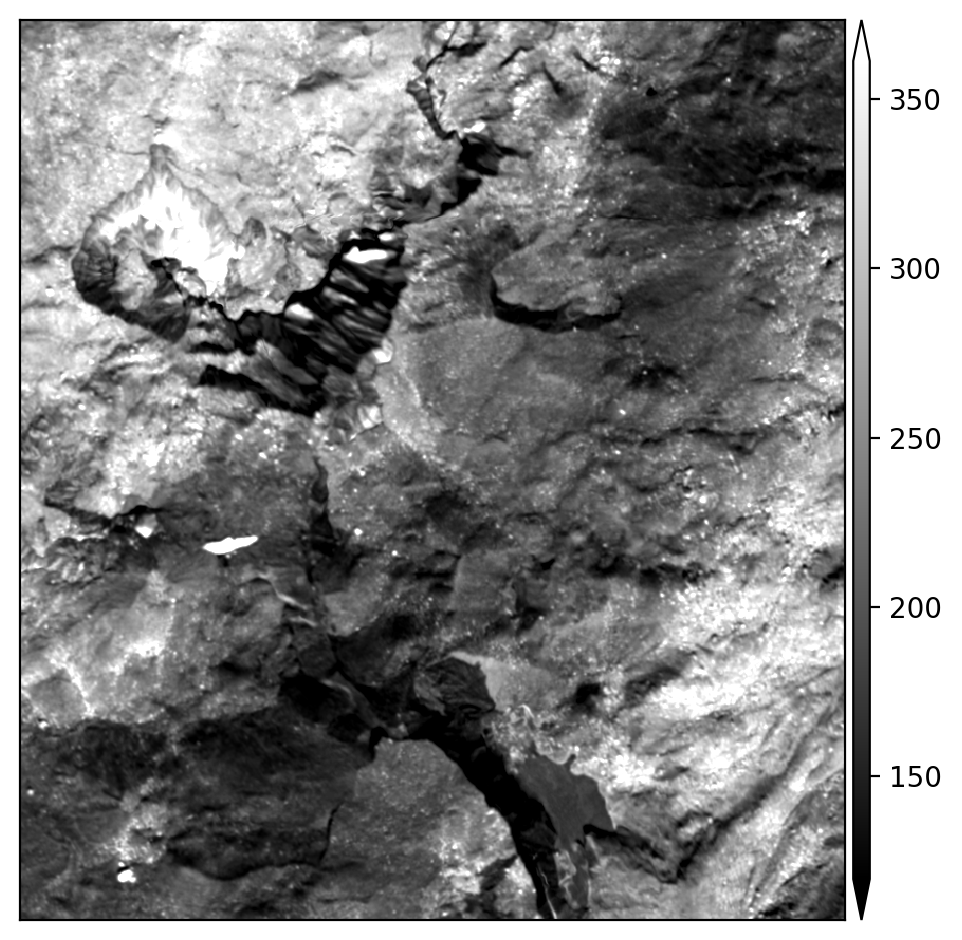

In [28]:
f,ax = plt.subplots()
pltlib.iv(cliff1_t2,ax=ax,cmap='gray')

In [29]:
ds_list_ortho_cliff1 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip_cliff_area1_trim.tif',
                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip_shifted_cliff_area1_trim.tif'])
cliff1_t1,cliff1_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff1]
low_res_extent = geolib.ds_extent(ds_list_ortho_cliff1[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1 = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_shpclip_cliff_area1_trim.tif
2 of 2: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_shpclip_shifted_cliff_area1_trim.tif

Warping all inputs to the following:
Resolution: 2.0
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 5: imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 217 ns: 199 res: 2.000
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 5: imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-

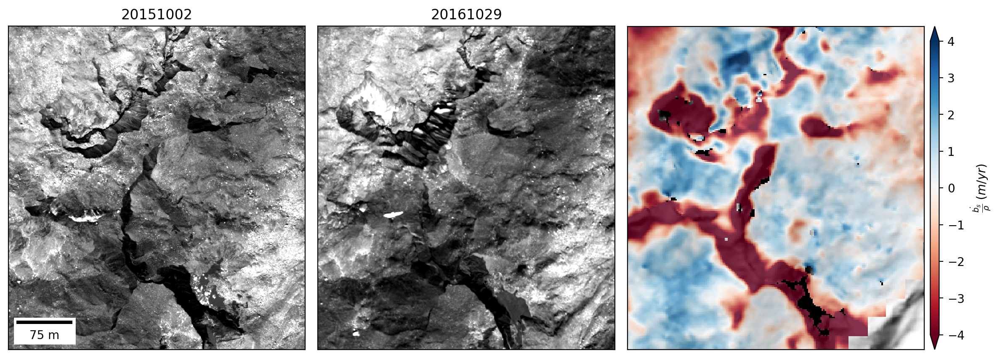

In [30]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff1_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff1_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{{b}_{s}}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

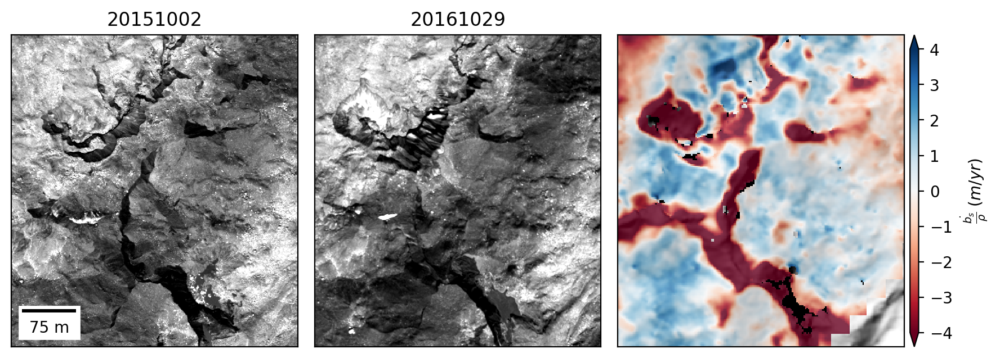

In [31]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff1_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff1_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{{b}_{s}}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## Upper Area

In [32]:
vx_fn = '20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vx_skiprate_1_gauss_fill51px_shpclip.tif'
vy_fn = '20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vy_skiprate_1_gauss_fill51px_shpclip.tif'
euldz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif'
lagdz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_lagrangian_dhdt.tif'
downslope_dz_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_downslope_dhdt.tif'
smb_fn = 'imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_smb_dhdt.tif'
dem1_fn = '../20151002_0651_10200100457F0C00_1020010042C0CE00-DEM_2m.tif'
ortho_img1 = '20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip.tif'
ortho_img2 = '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip.tif'

In [33]:
ds_list = warplib.memwarp_multi_fn([ortho_img1,ortho_img2,vx_fn,vy_fn])


Warping all inputs to the following:
Resolution: 0.51
Extent: [493534.31539915723, 3087354.893492993, 496723.32539915724, 3089405.463492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 4: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip.tif
nl: 4021 ns: 6253 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 4: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip.tif
nl: 4021 ns: 6253 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...3 of 4: 20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vx_skiprate_1_gauss_fill51px_shpclip.tif
nl: 4021 ns: 6253 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...4 of 4: 20151002_combine

In [34]:
dt = timelib.get_t_factor(timelib.fn_getdatetime(ortho_img1),timelib.fn_getdatetime(ortho_img2))
ortho1,ortho2,vx,vy = [iolib.ds_getma(ds) for ds in ds_list]
_,ortho2_shifted = glac_dyn.compute_lagrangian(ortho1.astype(np.float32),ortho2.astype(np.float32),vx,vy,dt,
                                               annual=True,res=geolib.get_res(ds_list[0])[0],startofpath=True,return_shifted_dem=True)

<Axes: >

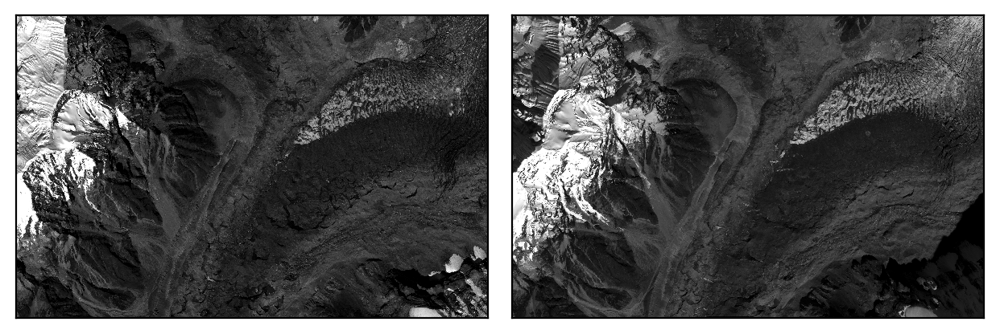

In [35]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
pltlib.iv(ortho1,ax=ax[0],cmap='gray',cbar=False)
pltlib.iv(ortho2_shifted,ax=ax[1],cmap='gray',cbar=False)

In [36]:
ax[0].get_ylim()

(4020.5, -0.5)

In [37]:
xlim = (3215.8667414293964, 5075.505635632056)
ylim = (3150.039565408624, 886.1313463793012)

In [39]:
mask_array = np.ma.getdata(np.ones_like(ortho1))
mask_array[int(ylim[1]):int(ylim[0]),int(xlim[0]):int(xlim[1])] = 0

<Axes: >

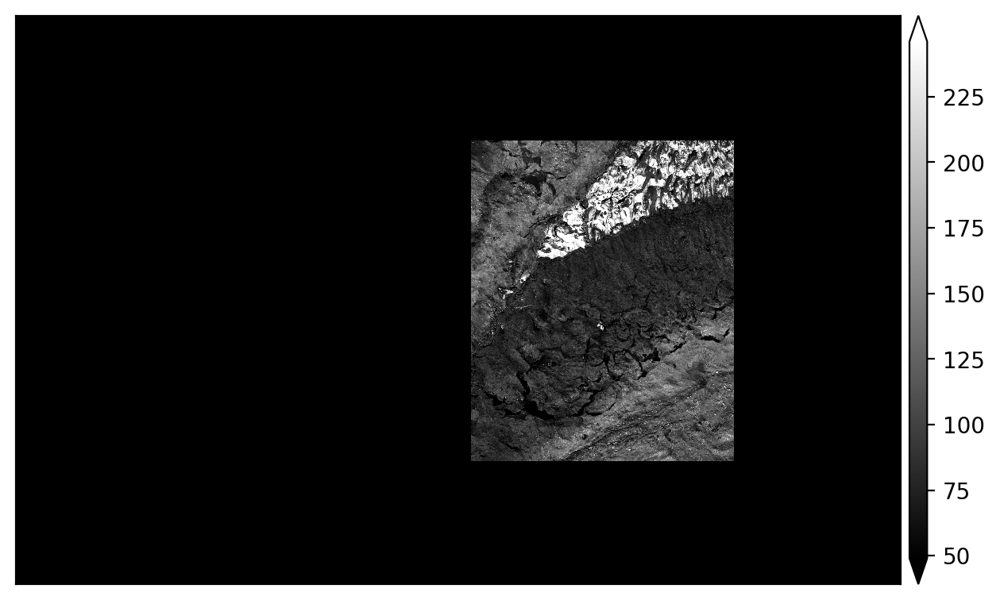

In [40]:
f,ax = plt.subplots()
pltlib.iv(np.ma.array(ortho1,mask=mask_array),ax=ax,cmap='gray')

In [41]:
clip_ortho1 = os.path.splitext(ortho_img1)[0]+'_zoom.tif'
clip_ortho2 = os.path.splitext(ortho_img2)[0]+'_shifted_zoom.tif'
iolib.writeGTiff(np.ma.array(ortho1,mask=mask_array),clip_ortho1,src_ds=ds_list[0])
iolib.writeGTiff(np.ma.array(ortho2_shifted,mask=mask_array),clip_ortho2,src_ds=ds_list[1])

In [42]:
! ndvtrim.py $clip_ortho1

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
Loading input raster into masked array
Computing min/max indices for mask
[0, 4021, 0, 6253]
[886, 3149, 3215, 5074]
Updating output geotransform
(493534.31539915723, 0.51, 0.0, 3089405.463492993, 0.0, -0.51)
(495173.96539915726, 0.51, 0.0, 3088953.603492993, 0.0, -0.51)
Writing out: 20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif


In [43]:
! ndvtrim.py $clip_ortho2

/swbuild/sbhusha1/miniconda3/envs/bhushanGDAL3/lib/python3.9/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
Loading input raster into masked array
Computing min/max indices for mask
[0, 4021, 0, 6253]
[886, 3149, 3215, 5074]
Updating output geotransform
(493534.31539915723, 0.51, 0.0, 3089405.463492993, 0.0, -0.51)
(495173.96539915726, 0.51, 0.0, 3088953.603492993, 0.0, -0.51)
Writing out: 20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif


In [44]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim__20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim_vmap_minm_35px_spm1/vmap-L.tif',
                                                 '20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim__20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim_vmap_minm_35px_spm1/vmap-R.tif'])
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1 = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: 20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim__20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim_vmap_minm_35px_spm1/vmap-L.tif
2 of 2: 20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim__20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim_vmap_minm_35px_spm1/vmap-R.tif

Warping all inputs to the following:
Resolution: 2.0
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 5: imja_farinotti_2015-10-02_to_2016-10-29_lag_smb_products/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 577 ns: 474 res: 2.000
100 - done.
0...10...20..

In [45]:
malib.calcperc(cliff2_t1)

(0.08147532492876053, 0.6096022725105286)

In [46]:
malib.calcperc(cliff2_t2)

(0.19307621873915196, 1.4028712267875707)

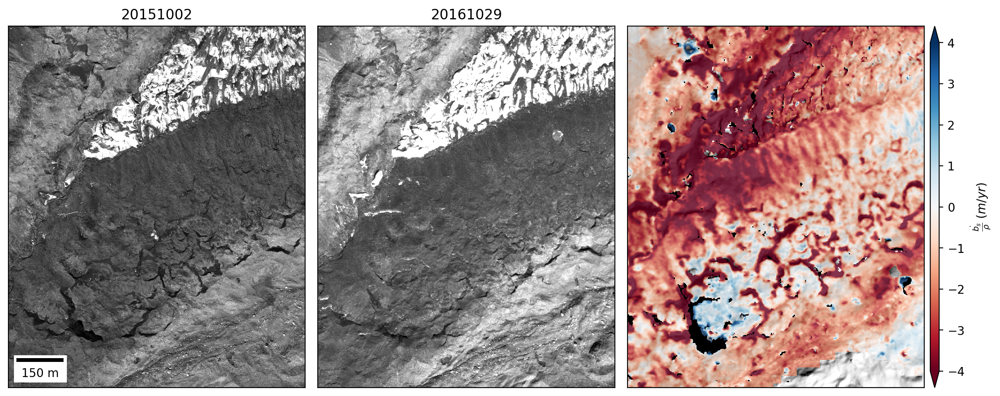

In [47]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{{b}_{s}}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

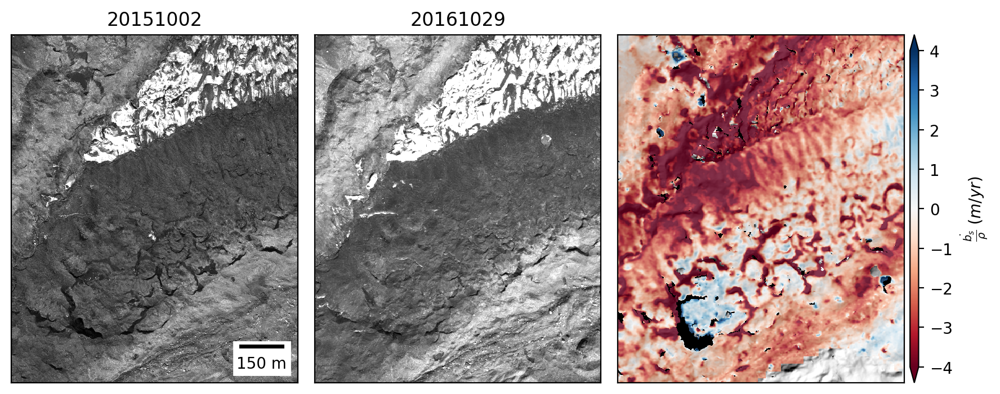

In [48]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower right')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{{b}_{s}}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)